
<br>
<font>
<div dir=ltr align=center>
<font color=0F5298 size=7>
    Machine Learning <br> <br>
<font color=2565AE size=5>
    CE Department <br>
    Fall 2024 - Prof. Sharifi Zarchi<br>
<font color=3C99D size=5>
    HW4 Practical <br>
    Image Colorization<br>
    Image Segmentation<br>
<font color=696880 size=4>
    Shayan Shabani


In [1]:
use_drive = True
try:
  from google.colab import drive
  drive.mount('/content/drive/')
except ImportError:
  use_drive = False

Mounted at /content/drive/


This assignment is structured to introduce students to practical applications of generative models in computer vision.
It targets two challenging areas: colorization and segmentation, using architectures that are complex but very applicable in industry settings.
## Machine Learning Assignment #4: Practical Applications in Image Processing

## Learning Objectives:
By the end of this assignment, students will be able to:
1. Understand and implement Variational Autoencoders for image colorization.
2. Apply the U-Net architecture for image segmentation.
3. Preprocess image datasets, including augmentation techniques.
4. Analyze the performance of machine learning models using relevant metrics.
5. Explore the relationship between latent space and output quality in generative models.


# Image Colorization using VAE
In this section of the assignment, students will explore the fascinating field of image colorization using Variational Autoencoders (VAEs), a type of generative model in deep learning. The task involves transforming grayscale images into colored ones, leveraging the encoder-decoder architecture of VAEs, which are adept at learning complex data distributions. Students will implement and fine-tune an autoencoder network, utilizing components like perceptual loss and feature extraction from pre-trained models, to improve colorization output. By doing so, they will gain a deeper understanding of generative models and their practical applications in computer vision tasks. This exercise offers a hands-on opportunity to blend theoretical knowledge with practical coding skills, characterizing the creative potential of AI in image processing.

Dataset: https://drive.google.com/drive/folders/1KeJbfUykGnPlz0q08_b1IjtW8OxkPdQ9?usp=sharing

## Importing Libraries

In [2]:
!pip install pytorch_lightning
!pip install seaborn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 819.3/819.3 kB 21.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 50.9 MB/s eta 0:00:00


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sea
from tqdm.notebook import tqdm
import os
import torch
import torch.nn as nn
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn.functional as F
import torchmetrics
from torchmetrics import Metric
import torchvision
import math

print(plt.style.available)
plt.style.use('seaborn-v0_8')
device = 'cuda' if torch.cuda.is_available() else 'cpu'

np.__version__, device

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


('1.26.4', 'cuda')

In [4]:
# Setting the random seeds
torch.manual_seed(17)
np.random.seed(43)

## Loading the Data

In [5]:
!cp '/content/drive/My Drive/archive-20241212T072020Z-001.zip' ./archive.zip
!unzip -q archive.zip

In [6]:
if use_drive:
    TRAIN_PATH = '/content/archive/train'
    TEST_PATH =  '/content/archive/test'
    VALID_PATH = '/content/archive/valid'
else:
    TRAIN_PATH = 'D:\\university\\term 5\\ML\\Homeworks\\HW4\\Practicals\\archive\\train'
    TEST_PATH =  'D:\\university\\term 5\\ML\\Homeworks\\HW4\\Practicals\\archive\\test'
    VALID_PATH = 'D:\\university\\term 5\\ML\\Homeworks\\HW4\\Practicals\\archive\\valid'

TRAIN_PATH

'/content/archive/train'

In [7]:
outcome_label = {o: d for o, d in enumerate(sorted(os.listdir(TRAIN_PATH)))}

In [8]:
import os
import pandas as pd
from tqdm import tqdm

def load_data(PATH):
    #Initialize lists to store filenames and their corresponding outcomes
    dir_list = sorted(os.listdir(PATH))
    outcomes = {d: o for o, d in enumerate(dir_list)}

    data = []
    for d in tqdm(dir_list, desc="Loading files"):
        dir_path = os.path.join(PATH, d)
        files_list = os.listdir(dir_path)
        for f in files_list:
            file_path = os.path.join(dir_path, f)
            outcome = outcomes[d]
            data.append((file_path, outcome))

    df = pd.DataFrame(data, columns=["filename", "outcome"])
    df = df.sample(frac=1)
    return df


# Loading the training, validation, and test data
train_df = load_data(TRAIN_PATH)
test_df = load_data(TEST_PATH)
valid_df = load_data(VALID_PATH)


# Checking the shape of the loaded DataFrames to verify correct data loading
train_df.shape, test_df.shape, valid_df.shape

Loading files: 100%|██████████| 20/20 [00:00<00:00, 10789.21it/s]


((3208, 2), (100, 2), (100, 2))

In [9]:
# Combine the training and test data into a single DataFrame along the vertical axis
test_train_df = pd.concat([train_df, test_df], axis=0, ignore_index=True).sample(frac=1)

In [10]:
# Explore the new DataFrame
test_train_df.info()
test_train_df.head()

<class 'pandas.core.frame.DataFrame'>
Index: 3308 entries, 464 to 1086
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  3308 non-null   object
 1   outcome   3308 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 77.5+ KB


,filename,outcome
464,/content/archive/train/AFRICAN FIREFINCH/002.jpg,5
2696,/content/archive/train/ABBOTTS BOOBY/089.jpg,1
2515,/content/archive/train/AMERICAN FLAMINGO/159.jpg,17
1134,/content/archive/train/AFRICAN CROWNED CRANE/0...,3
2078,/content/archive/train/ALBERTS TOWHEE/005.jpg,10


## Plot some of the images

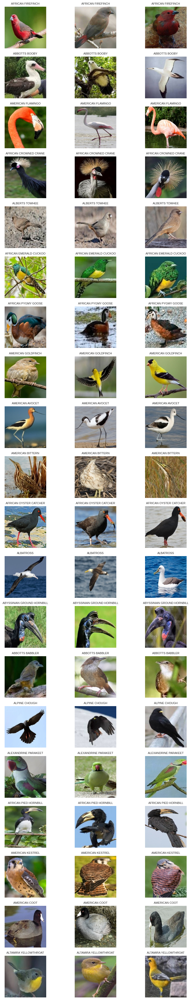

In [11]:
from PIL import Image

def show_sample_images(df, columns=3):
    outcomes = df['outcome'].unique()
    fig, axs = plt.subplots(nrows=len(outcomes), ncols=columns, figsize=(10,50))

    for i,o in enumerate(outcomes):
        sample_images = (df[df['outcome'] == o].sample(n=columns, random_state=43))["filename"]
        for j, f in enumerate(sample_images):
            img = Image.open(f)
            axs[i][j].imshow(img)
            axs[i][j].axis('off')
            axs[i][j].set_title(outcome_label[o], fontsize=8)

    plt.show()

show_sample_images(test_train_df)

### Dataset Distribution
plot the distribution of the dataset, both training and validation set

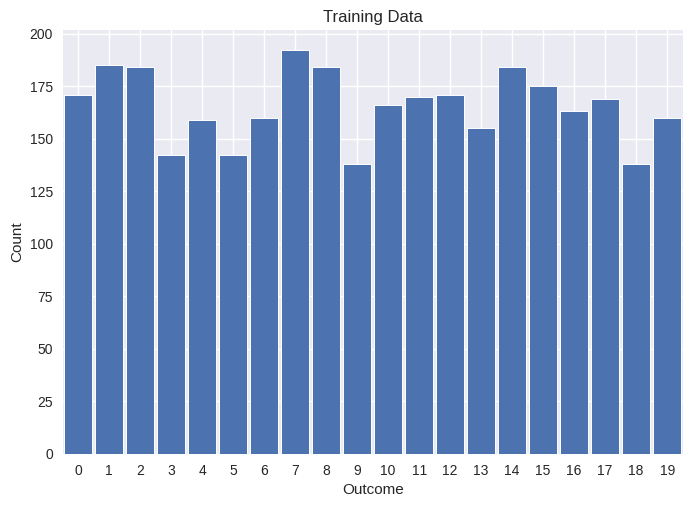

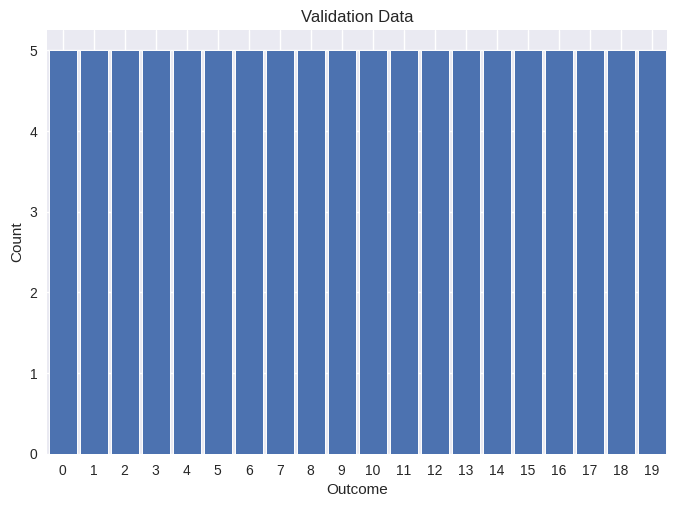

In [12]:
def draw_histogram(df, title):
    count_df = df.groupby('outcome').size().reset_index(name='filename')
    fig, ax = plt.subplots()
    ax.bar(count_df['outcome'], count_df['filename'], width=0.9, edgecolor="white", linewidth=0.7)
    ax.set(xlim=(-.5,19.5), xticks=range(0,20))

    plt.title(title)
    plt.xlabel('Outcome')
    plt.ylabel('Count')

    plt.show()

draw_histogram(test_train_df, "Training Data")
draw_histogram(valid_df, "Validation Data")

## Dataset Preparation
Now we are going to build the dataset by using `Dataset` and `DataLoader` classes within PyTorch. I recommend you to randomly crop the images to (160, 160) and then normalize them.

In [13]:
class BirdDataset:
    def __init__(self, df, transform = None):
        self.df = df
        self.size = (160, 160)
        self.transform = transform
        self.resize = transforms.Resize(self.size)
        self.random_crop = transforms.RandomCrop(self.size)
        self.to_tensor = transforms.ToTensor()
        self.normilize = transforms.Normalize(mean=[0.5], std=[0.5])
        self.device = 'cuda' if torch.cuda.is_available() else 'cpu'


    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_path = self.df.iloc[idx]['filename']
        img = Image.open(img_path)
        img = self.random_crop.forward(img)

        original_img = self.to_tensor(img)

        transformed_img = self.transform(img) if self.transform is not None else img
        transformed_img = transformed_img.convert('L')
        transformed_img = self.to_tensor(transformed_img)
        transformed_img = self.normilize.forward(transformed_img)

        return transformed_img, original_img

    def get_original(self, idx):
        img_path = self.df.iloc[idx]['filename']
        img = Image.open(img_path)
        img = self.resize(img)
        original_img = self.to_tensor(img)
        gray_img = self.to_tensor(img.convert('L'))
        gray_img = self.normilize.forward(gray_img)
        return  gray_img, original_img

    def get_lable(self, idx):
        img_path = self.df.iloc[idx]['filename']
        lable = self.df.iloc[idx]['outcome']
        img = Image.open(img_path)
        img = self.random_crop.forward(img)

        transformed_img = self.transform(img) if self.transform is not None else img
        transformed_img = transformed_img.convert('L')
        transformed_img = self.to_tensor(transformed_img)
        transformed_img = self.normilize.forward(transformed_img)

        return transformed_img, lable


In [14]:
train_transform = transforms.Compose([
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
])

train_dataset = BirdDataset(test_train_df, transform=train_transform)
validation_dataset = BirdDataset(valid_df)

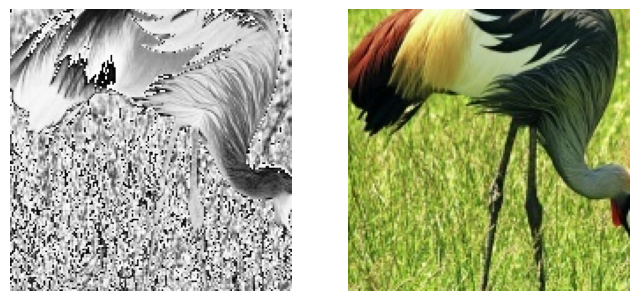

In [15]:
from torchvision.transforms.functional import to_pil_image

original, transformed = train_dataset[3]
original, transformed = to_pil_image(original), to_pil_image(transformed)
fig, axs = plt.subplots(nrows=1, ncols=2)
axs[0].imshow(original)
axs[0].axis('off')
axs[1].imshow(transformed)
axs[1].axis('off')
plt.show()

**Why is data augmentation pivotal in training models for image tasks, and what techniques are beneficial for this particular assignment?**

## Model Architecture
The model has an encoder block for encoding the grayscale image into a lower representation followed by a decoder block to generate the colorized image.

In [16]:
import torchvision.models as models
import torch.nn as nn
import torch
import torch.optim as optim
from tqdm import tqdm
import math
from torchvision import transforms

# The following classes define the various components of our VAE model.
# Each class includes a simple explanation of its role in the overall architecture.

# The VAE consists of an encoder to compress the input into a smaller latent representation,
# and a decoder to reconstruct the colorized output from the latent space.


class PerceptualLoss(nn.Module):
    def __init__(self, feature_layers=None, use_half=False):
        super(PerceptualLoss, self).__init__()
        self.vgg = models.vgg16(pretrained=True).features
        self.feature_layers = feature_layers or [3, 8, 15, 22]
        self.use_half = use_half
        for param in self.vgg.parameters():
            param.requires_grad = False

    def forward(self, x, y):
        loss = 0
        for layer in self.feature_layers:
            x = self.vgg[:layer](x)
            y = self.vgg[:layer](y)
            if self.use_half:
                x = x.half()
                y = y.half()
            loss += torch.mean((x - y) ** 2)
        return loss


class Encoder(nn.Module):
    def __init__(self, do_bn=False):
        super(Encoder, self).__init__()
        self.do_bn = do_bn
        self.enc1 = self.inner_block(1, 8)
        self.enc2 = self.inner_block(8, 32, maxpool=None)
        self.enc3 = self.inner_block(32, 32)
        self.enc4 = self.inner_block(32, 128, maxpool=None)
        self.enc5 = self.inner_block(128 ,256)
        self.enc6 = self.inner_block(256 ,256, maxpool=None)


    def inner_block(self, in_c, out_c, maxpool=2, p_drop=0.25):
        layers = [nn.Conv2d(in_c, out_c, kernel_size=3, padding=1)]
        if self.do_bn:
          layers.append(nn.BatchNorm2d(out_c))
        layers.append(nn.ReLU(inplace=True))
        if maxpool:
            layers.append(nn.MaxPool2d(maxpool))
        layers.append(nn.Dropout(p_drop))
        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.enc1(x)
        x = self.enc2(x)
        x = self.enc3(x)
        x = self.enc4(x)
        x = self.enc5(x)
        x = self.enc6(x)
        return x


class Decoder(nn.Module):
    def __init__(self, do_bn):
        super(Decoder, self).__init__()
        self.do_bn = do_bn
        self.dec1 = self.conv_block(256, 256)
        self.dec2 = self.inner_block(256, 128)
        self.dec3 = self.conv_block(128, 32)
        self.dec4 = self.inner_block(32, 32)
        self.dec5 = self.conv_block(32, 8)
        self.dec6 = self.inner_block(8, 3, out=True)

    def inner_block(self, in_c, out_c, out=False, p_drop=0.25):
        layers = [
            nn.ConvTranspose2d(in_c, out_c, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ReLU(inplace=True),
        ]
        if self.do_bn:
            layers.insert(1, nn.BatchNorm2d(out_c))
        if not out:
            layers.append(nn.Dropout(p_drop))
        return nn.Sequential(*layers)

    def conv_block(self, in_c, out_c):
        layers = [
            nn.Conv2d(in_c, out_c, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        ]
        if self.do_bn:
            layers.insert(1, nn.BatchNorm2d(out_c))
        return nn.Sequential(*layers)

    def forward(self, h):
        h = self.dec1(h)
        h = self.dec2(h)
        h = self.dec3(h)
        h = self.dec4(h)
        h = self.dec5(h)
        h = self.dec6(h)
        return h


# Hint: Integrate the encoder, decoder, and loss components into the overall network class.
class Net(nn.Module):
    def __init__(self, do_bn=True, use_perceptual=True, lr=1e-3, batch=32):
        super(Net, self).__init__()
        self.encoder = Encoder(do_bn)
        self.decoder = Decoder(do_bn)
        self.loss_fn = PerceptualLoss() if use_perceptual else nn.MSELoss()
        self.device = 'cuda' if torch.cuda.is_available() else 'cpu'
        self.to(self.device)
        self.optim = optim.Adam(self.parameters(), lr=lr)
        self.train_loader = None
        self.val_loader = None
        self.lr = lr
        self.batch = batch


    def set_training_data(self, training_set):
        self.train_loader  = DataLoader(training_set,
                          batch_size=self.batch,
                          shuffle=True,
                          num_workers=2
                  )


    def set_validation_data(self, validation_set):
        self.val_loader = DataLoader(validation_set,
                          batch_size=self.batch,
                          shuffle=False,
                          num_workers=2
                  )


    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

    def compute_loss(self, pred, target):
        return self.loss_fn(pred, target)

    def training_step(self, X):
        input, target = X
        input = input.to(self.device)
        target = target.to(self.device)
        self.optim.zero_grad()
        pred = self.forward(input)
        loss = self.loss_fn(pred, target)
        loss.backward()
        self.optim.step()
        running_loss = loss.item()
        return running_loss

    def train_one_epoch(self):
        self.train(True)
        train_losses = []
        for data in tqdm(self.train_loader, desc='Training:'):
            running_loss = self.training_step(data)
            train_losses.append(running_loss)
        avg_training_loss = torch.tensor(train_losses).mean()
        return avg_training_loss


    def validation_step(self):
        self.eval()
        val_losses = []
        with torch.no_grad():
            for data in tqdm(self.val_loader, desc='Validating:'):
                input, target = data
                input = input.to(self.device)
                target = target.to(self.device)

                pred = self(input)
                loss = self.compute_loss(pred, target)
                val_losses.append(loss.item())
        avg_val_loss = torch.tensor(val_losses).mean()
        return avg_val_loss



    def train_model(self, epochs=10):
        training_loss = []
        validation_loss = []

        for epoch in range(epochs):
            train_loss = self.train_one_epoch()
            val_loss = self.validation_step()
            training_loss.append(train_loss)
            validation_loss.append(val_loss)
            print(f'[Epoch: {epoch + 1}] [Train loss : {train_loss:0.4f}] [Val loss: {val_loss:.4f}]')

        return training_loss, validation_loss




In [17]:
model = Net(use_perceptual=False)
print(model)

Net(
  (encoder): Encoder(
    (enc1): Sequential(
      (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (4): Dropout(p=0.25, inplace=False)
    )
    (enc2): Sequential(
      (0): Conv2d(8, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Dropout(p=0.25, inplace=False)
    )
    (enc3): Sequential(
      (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (4): Dropout(p=0.25, inplace=False)
 

In [18]:
from torchsummary import summary
summary(model, (1, 160, 160))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 8, 160, 160]              80
       BatchNorm2d-2          [-1, 8, 160, 160]              16
              ReLU-3          [-1, 8, 160, 160]               0
         MaxPool2d-4            [-1, 8, 80, 80]               0
           Dropout-5            [-1, 8, 80, 80]               0
            Conv2d-6           [-1, 32, 80, 80]           2,336
       BatchNorm2d-7           [-1, 32, 80, 80]              64
              ReLU-8           [-1, 32, 80, 80]               0
           Dropout-9           [-1, 32, 80, 80]               0
           Conv2d-10           [-1, 32, 80, 80]           9,248
      BatchNorm2d-11           [-1, 32, 80, 80]              64
             ReLU-12           [-1, 32, 80, 80]               0
        MaxPool2d-13           [-1, 32, 40, 40]               0
          Dropout-14           [-1, 32,

## Training Phase

In [19]:
model.set_training_data(train_dataset)
model.set_validation_data(validation_dataset)

In [20]:
train_loss, val_loss = model.train_model(epochs=50)

Validating:: 100%|██████████| 4/4 [00:00<00:00, 13.21it/s]


[Epoch: 1] [Train loss : 0.1107] [Val loss: 0.0658]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 13.17it/s]


[Epoch: 2] [Train loss : 0.0453] [Val loss: 0.0372]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 13.42it/s]


[Epoch: 3] [Train loss : 0.0407] [Val loss: 0.0349]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 13.65it/s]


[Epoch: 4] [Train loss : 0.0377] [Val loss: 0.0337]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 11.73it/s]


[Epoch: 5] [Train loss : 0.0321] [Val loss: 0.0225]


Validating:: 100%|██████████| 4/4 [00:00<00:00,  8.16it/s]


[Epoch: 6] [Train loss : 0.0215] [Val loss: 0.0160]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 13.06it/s]


[Epoch: 7] [Train loss : 0.0193] [Val loss: 0.0148]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 13.23it/s]


[Epoch: 8] [Train loss : 0.0183] [Val loss: 0.0139]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 13.02it/s]


[Epoch: 9] [Train loss : 0.0178] [Val loss: 0.0144]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 13.25it/s]


[Epoch: 10] [Train loss : 0.0175] [Val loss: 0.0141]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 12.62it/s]


[Epoch: 11] [Train loss : 0.0171] [Val loss: 0.0134]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 12.83it/s]


[Epoch: 12] [Train loss : 0.0169] [Val loss: 0.0138]


Validating:: 100%|██████████| 4/4 [00:00<00:00,  8.63it/s]


[Epoch: 13] [Train loss : 0.0166] [Val loss: 0.0134]


Validating:: 100%|██████████| 4/4 [00:00<00:00,  8.86it/s]


[Epoch: 14] [Train loss : 0.0165] [Val loss: 0.0154]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 13.50it/s]


[Epoch: 15] [Train loss : 0.0163] [Val loss: 0.0132]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 13.05it/s]


[Epoch: 16] [Train loss : 0.0162] [Val loss: 0.0134]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 13.41it/s]


[Epoch: 17] [Train loss : 0.0161] [Val loss: 0.0140]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 13.20it/s]


[Epoch: 18] [Train loss : 0.0158] [Val loss: 0.0129]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 13.17it/s]


[Epoch: 19] [Train loss : 0.0156] [Val loss: 0.0137]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 13.46it/s]


[Epoch: 20] [Train loss : 0.0155] [Val loss: 0.0138]


Validating:: 100%|██████████| 4/4 [00:00<00:00,  8.34it/s]


[Epoch: 21] [Train loss : 0.0155] [Val loss: 0.0133]


Validating:: 100%|██████████| 4/4 [00:00<00:00,  8.40it/s]


[Epoch: 22] [Train loss : 0.0153] [Val loss: 0.0136]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 12.85it/s]


[Epoch: 23] [Train loss : 0.0155] [Val loss: 0.0130]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 12.51it/s]


[Epoch: 24] [Train loss : 0.0155] [Val loss: 0.0134]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 12.96it/s]


[Epoch: 25] [Train loss : 0.0152] [Val loss: 0.0134]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 12.85it/s]


[Epoch: 26] [Train loss : 0.0151] [Val loss: 0.0136]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 12.86it/s]


[Epoch: 27] [Train loss : 0.0151] [Val loss: 0.0135]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 12.88it/s]


[Epoch: 28] [Train loss : 0.0149] [Val loss: 0.0134]


Validating:: 100%|██████████| 4/4 [00:00<00:00,  8.88it/s]


[Epoch: 29] [Train loss : 0.0150] [Val loss: 0.0124]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 10.45it/s]


[Epoch: 30] [Train loss : 0.0149] [Val loss: 0.0139]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 12.59it/s]


[Epoch: 31] [Train loss : 0.0148] [Val loss: 0.0125]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 12.42it/s]


[Epoch: 32] [Train loss : 0.0149] [Val loss: 0.0134]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 13.31it/s]


[Epoch: 33] [Train loss : 0.0147] [Val loss: 0.0140]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 13.26it/s]


[Epoch: 34] [Train loss : 0.0148] [Val loss: 0.0129]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 12.99it/s]


[Epoch: 35] [Train loss : 0.0146] [Val loss: 0.0133]


Validating:: 100%|██████████| 4/4 [00:00<00:00,  8.72it/s]


[Epoch: 36] [Train loss : 0.0146] [Val loss: 0.0123]


Validating:: 100%|██████████| 4/4 [00:00<00:00,  8.54it/s]


[Epoch: 37] [Train loss : 0.0145] [Val loss: 0.0126]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 12.89it/s]


[Epoch: 38] [Train loss : 0.0144] [Val loss: 0.0128]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 13.23it/s]


[Epoch: 39] [Train loss : 0.0146] [Val loss: 0.0146]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 13.01it/s]


[Epoch: 40] [Train loss : 0.0144] [Val loss: 0.0127]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 12.20it/s]


[Epoch: 41] [Train loss : 0.0144] [Val loss: 0.0122]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 12.81it/s]


[Epoch: 42] [Train loss : 0.0143] [Val loss: 0.0127]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 12.92it/s]


[Epoch: 43] [Train loss : 0.0143] [Val loss: 0.0136]


Validating:: 100%|██████████| 4/4 [00:00<00:00,  8.32it/s]


[Epoch: 44] [Train loss : 0.0144] [Val loss: 0.0126]


Validating:: 100%|██████████| 4/4 [00:00<00:00,  7.90it/s]


[Epoch: 45] [Train loss : 0.0143] [Val loss: 0.0125]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 13.27it/s]


[Epoch: 46] [Train loss : 0.0144] [Val loss: 0.0126]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 13.09it/s]


[Epoch: 47] [Train loss : 0.0142] [Val loss: 0.0122]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 13.41it/s]


[Epoch: 48] [Train loss : 0.0142] [Val loss: 0.0114]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 13.24it/s]


[Epoch: 49] [Train loss : 0.0142] [Val loss: 0.0123]


Validating:: 100%|██████████| 4/4 [00:00<00:00, 13.31it/s]

[Epoch: 50] [Train loss : 0.0139] [Val loss: 0.0121]


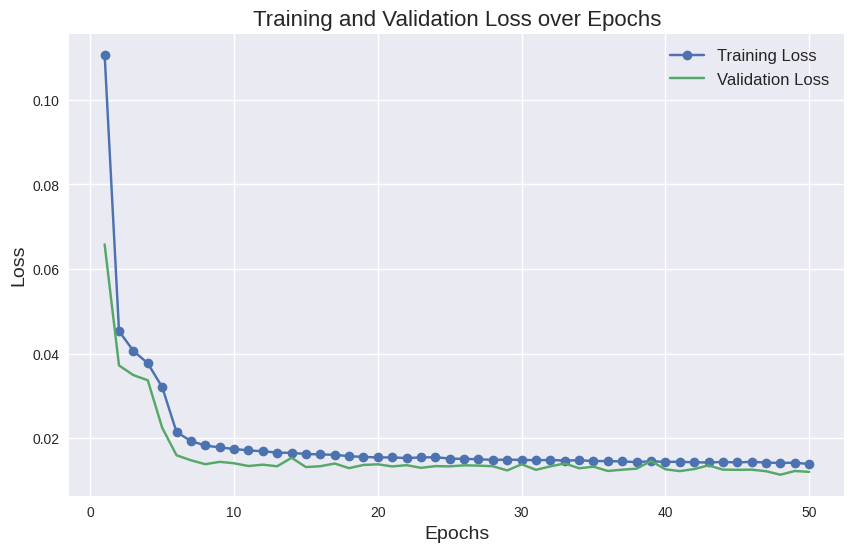

In [21]:
epochs = range(1, len(train_loss) + 1)

plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss, label='Training Loss', marker='o')
plt.plot(epochs, val_loss, label='Validation Loss', marker='x')

plt.title('Training and Validation Loss over Epochs', fontsize=16)
plt.xlabel('Epochs', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)
plt.show()

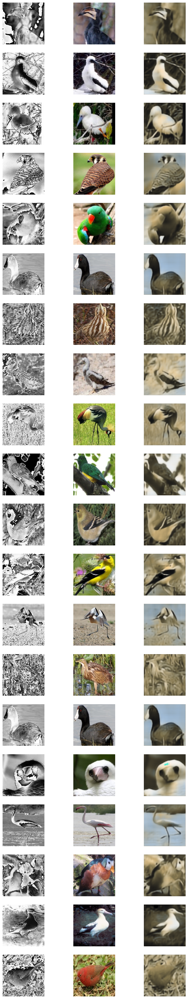

In [22]:
import random

def get_images(model, dataset, idx):
    gray_scale, actual = dataset.get_original(idx)
    gray =to_pil_image(gray_scale)
    actual =  to_pil_image(actual)


    gray_scale = gray_scale.unsqueeze(0).to(device)
    model.eval()
    x = model(gray_scale)
    pred = to_pil_image(x.squeeze(0))
    return gray, actual, pred


fig, axs = plt.subplots(nrows=20, ncols=3, figsize=(10,50))
for _ in range(20):
    i = random.randint(0,99)
    gray, actual, pred = get_images(model, train_dataset, i)
    axs[_][0].imshow(gray)
    axs[_][0].axis('off')
    axs[_][1].imshow(actual)
    axs[_][1].axis('off')
    axs[_][2].imshow(pred)
    axs[_][2].axis('off')
plt.show()

In [23]:
class BirdLabeledDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        image_path = self.df.loc[idx, 'filename']
        label = self.df.loc[idx, 'outcome']

        image = Image.open(image_path).convert('L')


        if self.transform:
            image = self.transform(image)
        else:
            image = transforms.ToTensor()(image)

        return image, label

transform_input = transforms.Compose([
    transforms.Resize((160, 160)),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5,), std=(0.5,))
])

labeleddataset = BirdLabeledDataset(
    test_train_df,
    transform=transform_input
)

labeleddata_loader = DataLoader(labeleddataset, batch_size=16, shuffle=True)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.052s...
[t-SNE] Computed neighbors for 1000 samples in 5.312s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 33.482272
[t-SNE] KL divergence after 250 iterations with early exaggeration: 83.905685
[t-SNE] KL divergence after 1000 iterations: 1.990389


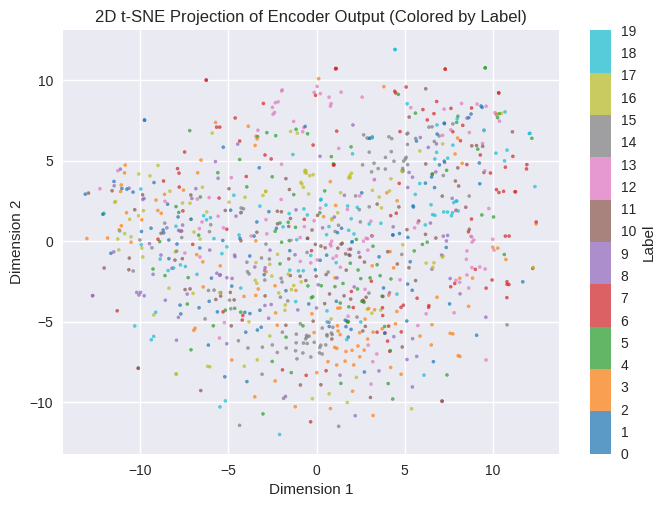

In [24]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import torch

def visualize_latent_space(encoder, data_loader, num_samples=1000):
    encoder.eval()

    device = next(encoder.parameters()).device

    all_latents = []
    all_labels = []
    samples_collected = 0

    with torch.no_grad():
        for images, labels in data_loader:
            if samples_collected >= num_samples:
                break
            images = images.to(device)
            latent_map = encoder(images)
            flattened = latent_map.view(latent_map.size(0), -1)
            all_latents.append(flattened.cpu())
            all_labels.append(labels.cpu())
            samples_collected += latent_map.size(0)

    all_latents = torch.cat(all_latents, dim=0)
    all_labels = torch.cat(all_labels, dim=0)

    all_latents = all_latents[:num_samples]
    all_labels = all_labels[:num_samples]

    tsne = TSNE(n_components=2, verbose=1, random_state=13, perplexity=30)
    latents_2d = tsne.fit_transform(all_latents.numpy())

    label_array = all_labels.numpy()

    scatter = plt.scatter(
        latents_2d[:, 0],
        latents_2d[:, 1],
        s=5,
        alpha=0.7,
        c=label_array,
        cmap='tab10'
    )

    plt.title("2D t-SNE Projection of Encoder Output (Colored by Label)")
    plt.xlabel("Dimension 1")
    plt.ylabel("Dimension 2")

    cbar = plt.colorbar(scatter, ticks=range(label_array.min(), label_array.max()+1))
    cbar.set_label('Label')


visualize_latent_space(encoder=model.encoder, data_loader=labeleddata_loader, num_samples=1000)

How the distribution of points in the latent space reflects the VAE's capability to generalize grayscale images into colored outputs.

1. **Clustering and Class Representation**:
    - Can you identify clusters in the latent space that correspond to specific image features or categories?<br>
    بله، هرچند که ممکن است به علت ۲ بعدی سازی این فضا، گروه های آن بر روی یک دیگر بیافتند اما می‌توان دید که عکس هایی که در یک گروه هستند در نزدیکی یک قرار می‌گیرند
    - How do these clusters inform us about the VAE's ability to differentiate between various input characteristics related to color information?<br>
    وجود کلاستر های متفاوت و مجزا به ما این قابلیت را می‌دهد که شبکه دی کدر را به گونه ای آموزش دهیم تا هر کلاس را متناسب با گروه خود رنگ آمیزی کند

2. **Continuity and Transitions**:
    - Analyze whether neighboring points in the latent space result in similar or different color outputs. What does this continuity suggest about the latent representation's smoothness?<br>
    نزدیک بودن دو گروه در این فضا نشان دهنده این است که این دو گروه از پرندگان رنگ بندی مشابهی دارند و به همن دلیل در این فضا کنار هم قرار گرفته اند<br>
    همچنین از انجایی که تصاویر مشابه نزدیک هم نگاشت می‌شوند به معنای هموار بودن این فضا است
    - How could these visual transitions impact the quality and realism of the generated colorations, especially for input images that exhibit gradual changes (e.g., transitions in lighting or shading)?
    هموار بودن فضا باعث می‌شود که تغییرات کوچک مانند تغییر نورپردازی یا جابه‌جایی عکس باعث تغییر ناگهانی در رنگ‌آمیزی نشود و تصاویر تولید شده واقع‌گرایانه باشند اما درصورتی که این فضا ناهموار باشد، تغییر کوچک در تصویر اولیه باعث تغییر در رنگآمیزی نهایی و تولید تصاویر نامطلوب می‌شود

3. **Effectiveness of Dimensionality Reduction**:
    - Assess the effectiveness of t-SNE in projecting high-dimensional latent vectors into a comprehensible 2D representation. What limitations might exist, and how do they affect your interpretation?<br>
    الگوریتم تی-اس‌ان‌ای به ما کمک می‌کند تا فضاهایی با تعداد ابعاد بالا را به فرم ۲ بعدی در إیاوریم تا یک نمای گرافیکی از ان را مشهاده کنیم و نسبت به آن شهود یابم اما برخی از جزيیات در این فرایند ممکن است که از بین بروند و یا توسط ما قابل تشخیص نباشند. به عنوان مثال در این مساله کلاستر ها بر روی یک دیگر افتادند.


Elaborate on how the encoder-decoder architecture facilitates the learning of complex data distributions in image colorization. How does this architecture differ from a simple autoencoder?<br>
معماری انکدر-دیکدر ابتدا داده ها را به یک فضای نهفته می‌فرستد و سپس خروجی را از آن فضا استخراج می‌کند. در مقابل اتوانکودر ها ورودی را مستقیما به خروجی تبدیل می‌کنند و این باعث می‌شود که توانیی کمتری نسبت به معماری انکودر-دیکدر داشته باشند.

Analyze the role of perceptual loss in enhancing the quality of colorized images. How does perceptual loss measure image similarity compared to pixel-wise losses like Mean Squared Error (MSE)?<br>
خطای پرسپچوال به مدل اجازه می‌دهد که با استفاده از یک شبکه عصبی از قبل آموزش دیده عکس ها را در سطوح بالا و بر اساس ویژگی هایشان مقایسه نماییم در مقابل خطای مربعات مقادیر هر پیکسل را با یک دیگر مقایسه می کند.

Discuss how the latent space in a VAE impacts the fidelity and diversity of generated color images. What effects could varying the dimensionality of the latent space have?<br>
یک فضای نهفته که به‌خوبی یاد گرفته شده باشد، تضمین می‌کند که تصاویر بازسازی‌شده با توزیع‌های رنگ واقعی مطابقت داشته باشند و در نتیجه رنگ‌آمیزی با کیفیت بالاتری حاصل شود. با این حال، تعداد ابعاد فضای نهفته تأثیر مهمی دارد: تعداد ابعاد کم می‌تواند تنوع خروجی‌ها را محدود و مدل را آندرفیت کند، در حالی که تعداد ابعاد زیاد ممکن است آموزش را ناپایدار کرده یا منجر به تولید تغییرات غیرمنطقی شود که به معنای اورفیت شدن مدل است. یافتن تعداد ابعاد مناسب، توازن بین دقت و تنوع را فراهم می‌کند.

# Image Segmentation with U-Net
Image segmentation is a crucial task in computer vision aimed at dividing an image into meaningful segments or objects. The U-Net architecture, famed for its utility in medical imaging, excels at this by leveraging its encoder-decoder structure, which efficiently learns and reconstructs image details. In this task, the U-Net is trained on pairs of images and masks, enabling it to delineate object boundaries at the pixel level with high precision. The training process involves preprocessing the data, adjusting network parameters, and evaluating the model using metrics like Intersection over Union (IoU) to ensure effective segmentation. Successful implementation of U-Net for this purpose can revolutionize applications in areas like autonomous vehicles, medical diagnosis, and agricultural monitoring.

Dataset: https://drive.google.com/drive/folders/1g97fGNQ6buixT8Hp96QyEYOMNKby5Oe8?usp=sharing

## Importing necessary libraries

In [25]:
# import system libs
import os
import time
import glob
import shutil
import random

# import data handling tools
import cv2
from PIL import Image
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt

# import necessary PyTorch libraries
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchsummary import summary
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
import torch.optim as optim
from tqdm import tqdm


print ('modules loaded')

modules loaded


## Load the Dataset

In [26]:
!cp '/content/drive/My Drive/seg_archive-20241222T104133Z-001.zip' ./seg_archive.zip
!unzip -q seg_archive.zip

In [27]:
if use_drive:
    IMAGE_DIR = '/content/seg_archive/Image'
    MASK_DIR = '/content/seg_archive/Mask'
else:
    IMAGE_DIR = 'D:\\university\\term 5\\ML\\Homeworks\\HW4\\Practicals\\seg_archive\\Image'
    MASK_DIR = 'D:\\university\\term 5\\ML\\Homeworks\\HW4\\Practicals\\seg_archive\\Mask'

IMAGE_DIR

'/content/seg_archive/Image'

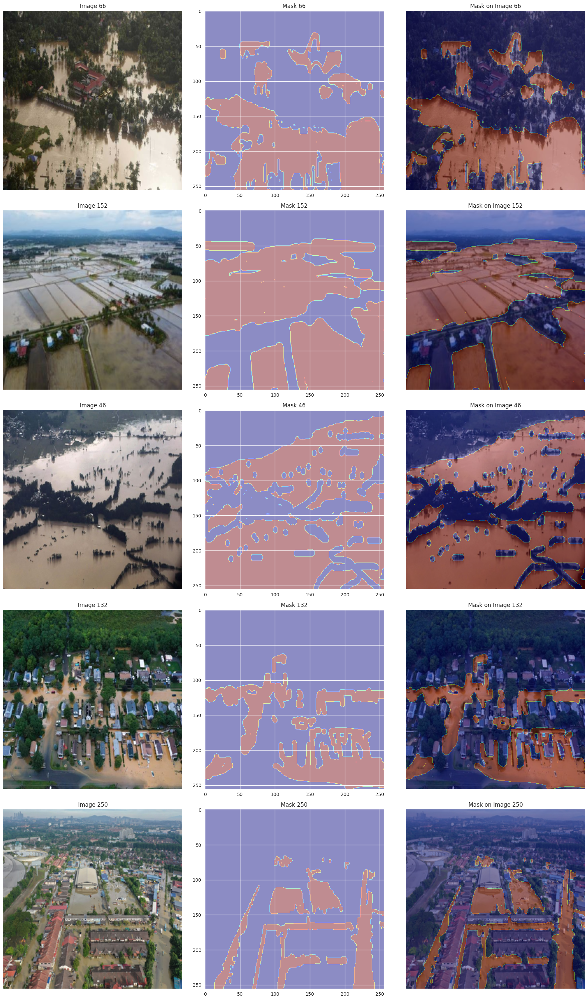

In [28]:
def create_data(image_dir, mask_dir):
    image_extension = ['.jpg']
    mask_extension = ['.png']

    image_paths = [
        os.path.join(image_dir, fname)
        for fname in os.listdir(image_dir)
        if os.path.splitext(fname.lower())[1] in image_extension
    ]

    mask_paths = [
        os.path.join(mask_dir, fname)
        for fname in os.listdir(mask_dir)
        if os.path.splitext(fname.lower())[1] in mask_extension
    ]

    image_paths = sorted(image_paths)
    mask_paths = sorted(mask_paths)

    return image_paths, mask_paths


def load_image(image_path, SIZE):
    with Image.open(image_path) as img:
        img = img.convert('RGB')
        img = img.resize((SIZE, SIZE), Image.Resampling.LANCZOS)
        img_array = np.array(img) / 255.0
    return img_array


def load_images(image_paths, SIZE, mask=False, trim=None):
    if trim:
        image_paths = image_paths[:trim]

    images = []
    for path in image_paths:
        if mask:
            with Image.open(path) as img:
                img = img.convert('L')
                img = img.resize((SIZE, SIZE), Image.Resampling.NEAREST)
                img_array = np.array(img) / 255.0
                img_array = np.expand_dims(img_array, axis=-1)
        else:
            img_array = load_image(path, SIZE)
        images.append(img_array)

    return np.array(images)

def show_image(image, title=None, cmap=None, alpha=1):
    plt.imshow(image, cmap=cmap, alpha=alpha)
    if title:
        plt.title(title)
    plt.axis('off')

def show_mask(image, mask, mask_only, cmap='jet', alpha=0.4):
    if not mask_only:
        show_image(image)
        plt.imshow(mask, cmap=cmap, alpha=alpha)
    else:
        plt.imshow(mask, cmap=cmap, alpha=alpha)

def show_images(imgs, msks, num_samples=5):
    if len(imgs) != len(msks):
        print("Error: The number of images and masks must be the same.")
        return

    num_samples = min(num_samples, len(imgs))
    indices = np.random.choice(len(imgs), num_samples, replace=False)

    plt.figure(figsize=(18, num_samples * 6))
    for i, idx in enumerate(indices):
        plt.subplot(num_samples, 3, 3*i + 1)
        show_image(imgs[idx])
        plt.title(f"Image {idx}")

        plt.subplot(num_samples, 3, 3*i + 2)
        show_mask(imgs[idx], msks[idx], mask_only=True)
        plt.title(f"Mask {idx}")

        plt.subplot(num_samples, 3, 3*i + 3)
        show_mask(imgs[idx], msks[idx], mask_only=False)
        plt.title(f"Mask on Image {idx}")

    plt.tight_layout()
    plt.show()

SIZE = 256


image_paths, mask_paths = create_data(IMAGE_DIR, MASK_DIR)

images = load_images(image_paths, SIZE, mask=False, trim=None)
masks = load_images(mask_paths, SIZE, mask=True, trim=None)

show_images(images, masks, num_samples=5)

## The Architecture
In addition to U-Net, we are going to utilize Attention Gates.
You probably need to read this paper: https://arxiv.org/pdf/1804.03999v3

In [29]:
class DiceLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, target):
        pred = pred.contiguous().view(pred.shape[0], -1)
        target = target.contiguous().view(target.shape[0], -1)
        intersection = (pred * target).sum(dim=1)
        dice = (2.0 * intersection + self.smooth) / (pred.sum(dim=1) + target.sum(dim=1) + self.smooth)
        return 1 - dice.mean()

class JaccardLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super(JaccardLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, target):
        pred = pred.contiguous().view(pred.shape[0], -1)
        target = target.contiguous().view(target.shape[0], -1)
        intersection = (pred * target).sum(dim=1)
        union = (pred + target).sum(dim=1) - intersection
        iou = (intersection + self.smooth) / (union + self.smooth)
        return 1 - iou.mean()

class EncoderBlock(nn.Module):
    def __init__(self, filters, pooling=True):
        super(EncoderBlock, self).__init__()

        self.conv1 = nn.Conv2d(filters[0], filters[1], kernel_size=3, padding=1, bias=True)
        self.bn1 = nn.BatchNorm2d(filters[1])
        self.relu1 = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(filters[1], filters[1], kernel_size=3, padding=1, bias=True)
        self.bn2 = nn.BatchNorm2d(filters[1])
        self.relu2 = nn.ReLU(inplace=True)

        self.pooling = pooling
        if pooling:
            self.pool = nn.MaxPool2d(kernel_size=2)

    def forward(self, X):
        X = self.conv1(X)
        X = self.bn1(X)
        X = self.relu1(X)
        X = self.conv2(X)
        X = self.bn2(X)
        X = self.relu2(X)
        if self.pooling:
            X = self.pool(X)
        return X

class DecoderBlock(nn.Module):
    def __init__(self, filters):
        super(DecoderBlock, self).__init__()
        self.up = nn.Upsample(scale_factor=2)
        self.conv1 = nn.Conv2d(filters[0], filters[1], kernel_size=3, padding=1, bias=True)
        self.bn1 = nn.BatchNorm2d(filters[1])
        self.relu1= nn.ReLU(inplace=True)

    def forward(self, X):
        X = self.up(X)
        X = self.conv1(X)
        X = self.bn1(X)
        X = self.relu1(X)
        return X

class AttentionGate(nn.Module):
    def __init__(self, in_channels, gating_channels, out_channels, bn=True):
        super(AttentionGate, self).__init__()
        self.Wg = nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=True)
        self.Wx = nn.Conv2d(gating_channels, out_channels, kernel_size=1, bias=True)
        self.bn = bn
        if bn:
            self.bn_g = nn.BatchNorm2d(out_channels)
            self.bn_x = nn.BatchNorm2d(out_channels)
        self.psi = nn.Conv2d(out_channels, 1, kernel_size=1, stride=1, bias=True)
        self.sigmoid = nn.Sigmoid()
        self.relu = nn.ReLU(inplace=True)

    def forward(self, g, X):
        g1 = self.Wg(g)
        x1 = self.Wx(X)
        if self.bn:
            g1 = self.bn_g(g1)
            x1 = self.bn_x(x1)
        psi = self.relu(g1 + x1)
        psi = self.psi(psi)
        psi = self.sigmoid(psi)
        return psi * X


class UNetModel(nn.Module):
    def __init__(self):
        super(UNetModel, self).__init__()
        self.down1 = EncoderBlock([3, 64], pooling=False)
        self.down2 = EncoderBlock([64, 128], pooling=True)
        self.down3 = EncoderBlock([128, 256], pooling=True)
        self.down4 = EncoderBlock([256, 512], pooling=True)

        self.up1 = DecoderBlock([512, 256])
        self.att1 = AttentionGate(256, 256, 128)
        self.upen1 = EncoderBlock([512, 256], pooling=False)

        self.up2 = DecoderBlock([256, 128])
        self.att2 = AttentionGate(128, 128, 64)
        self.upen2 = EncoderBlock([256, 128], pooling=False)

        self.up3 = DecoderBlock([128, 64])
        self.att3 = AttentionGate(64, 64, 32)
        self.upen3 = EncoderBlock([128, 64], pooling=False)

        self.out_conv = nn.Conv2d(64, 1, kernel_size=1)

    def forward(self, x):
        d1 = self.down1(x)
        d2 = self.down2(d1)
        d3 = self.down3(d2)
        d4 = self.down4(d3)

        u1 = self.up1(d4)
        a1 = self.att1(u1, d3)
        u1 = self.upen1(torch.concat((a1, u1), dim=1))

        u2 = self.up2(u1)
        a2 = self.att2(u2, d2)
        u2 = self.upen2(torch.concat((a2, u2), dim=1))

        u3 = self.up3(u2)
        a3 = self.att3(u3, d1)
        u3 = self.upen3(torch.concat((a3, u3), dim=1))

        output = torch.sigmoid(self.out_conv(u3))

        return output

    def compute_loss(self, pred, target):
        dice_loss = DiceLoss()(pred, target)
        jaccard_loss = JaccardLoss()(pred, target)
        return dice_loss + jaccard_loss

    def compute_accuracy(self, pred, real):
        pred = (pred > 0.5).float()
        correct = (pred == real).float()
        accuracy = correct.sum() / correct.numel()
        return accuracy

unet_model = UNetModel()

device = 'cuda' if torch.cuda.is_available() else 'cpu'

unet_model.to(device)

summary(unet_model, (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
            Conv2d-4         [-1, 64, 256, 256]          36,928
       BatchNorm2d-5         [-1, 64, 256, 256]             128
              ReLU-6         [-1, 64, 256, 256]               0
      EncoderBlock-7         [-1, 64, 256, 256]               0
            Conv2d-8        [-1, 128, 256, 256]          73,856
       BatchNorm2d-9        [-1, 128, 256, 256]             256
             ReLU-10        [-1, 128, 256, 256]               0
           Conv2d-11        [-1, 128, 256, 256]         147,584
      BatchNorm2d-12        [-1, 128, 256, 256]             256
             ReLU-13        [-1, 128, 256, 256]               0
        MaxPool2d-14        [-1, 128, 1

## Training

In [30]:
class SegmentationDataset(Dataset):
    def __init__(self, images, masks, transform=None):
        self.images = images
        self.masks = masks
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img = self.images[idx]
        msk = self.masks[idx]

        img = np.transpose(img, (2, 0, 1))
        msk = np.transpose(msk, (2, 0, 1))

        img_tensor = torch.from_numpy(img).float()
        msk_tensor = torch.from_numpy(msk).float()

        if self.transform:
            img_tensor = self.transform(img_tensor)
            msk_tensor = self.transform(msk_tensor)

        return img_tensor, msk_tensor

In [31]:
train_images, val_images, train_masks, val_masks = train_test_split(
    images, masks, test_size=0.2, random_state=13
)

train_dataset = SegmentationDataset(train_images, train_masks)
val_dataset   = SegmentationDataset(val_images, val_masks)


batch_size = 4
train_loader = DataLoader(train_dataset, batch_size=batch_size, num_workers=4, pin_memory=True, shuffle=True)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, num_workers=4, pin_memory=True, shuffle=False)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [32]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

optimizer = optim.Adam(unet_model.parameters(), lr=1e-4)

num_epochs = 50
history = {
    "train_loss": [],
    "val_loss": [],
    "train_acc": [],
    "val_acc": []
}

for epoch in range(num_epochs):
    unet_model.train()
    running_train_loss = 0.0
    running_train_acc = 0.0

    train_pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Train]", leave=False)
    for images_batch, masks_batch in train_pbar:
        images_batch = images_batch.to(device)
        masks_batch  = masks_batch.to(device)

        optimizer.zero_grad()

        preds = unet_model(images_batch)

        loss = unet_model.compute_loss(preds, masks_batch)
        acc  = unet_model.compute_accuracy(preds, masks_batch)

        loss.backward()
        optimizer.step()

        running_train_loss += loss.item()
        running_train_acc  += acc.item()

        train_pbar.set_postfix({"loss": f"{loss.item():.4f}", "acc": f"{acc.item():.4f}"})

    train_loss = running_train_loss / len(train_loader)
    train_acc  = running_train_acc  / len(train_loader)

    unet_model.eval()
    running_val_loss = 0.0
    running_val_acc  = 0.0

    val_pbar = tqdm(val_loader, desc="Validation", leave=False)
    with torch.no_grad():
        for images_batch, masks_batch in val_pbar:
            images_batch = images_batch.to(device)
            masks_batch  = masks_batch.to(device)

            preds = unet_model(images_batch)
            val_loss = unet_model.compute_loss(preds, masks_batch)
            val_acc  = unet_model.compute_accuracy(preds, masks_batch)

            running_val_loss += val_loss.item()
            running_val_acc  += val_acc.item()

            val_pbar.set_postfix({"val_loss": f"{val_loss.item():.4f}",
                                  "val_acc":  f"{val_acc.item():.4f}"})

    val_loss = running_val_loss / len(val_loader)
    val_acc  = running_val_acc  / len(val_loader)

    history["train_loss"].append(train_loss)
    history["val_loss"].append(val_loss)
    history["train_acc"].append(train_acc)
    history["val_acc"].append(val_acc)

    print(f"[Epoch {epoch+1}/{num_epochs}]"
          f" Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f},"
          f" Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

[Epoch 1/50] Train Loss: 0.8600, Train Acc: 0.7914, Val Loss: 0.7427, Val Acc: 0.8174


[Epoch 2/50] Train Loss: 0.7512, Train Acc: 0.8163, Val Loss: 0.6607, Val Acc: 0.8433


[Epoch 3/50] Train Loss: 0.7028, Train Acc: 0.8321, Val Loss: 0.6199, Val Acc: 0.8565


[Epoch 4/50] Train Loss: 0.6738, Train Acc: 0.8321, Val Loss: 0.6573, Val Acc: 0.8423


[Epoch 5/50] Train Loss: 0.6538, Train Acc: 0.8346, Val Loss: 0.6105, Val Acc: 0.8254


[Epoch 6/50] Train Loss: 0.6366, Train Acc: 0.8401, Val Loss: 0.5942, Val Acc: 0.8460


[Epoch 7/50] Train Loss: 0.6357, Train Acc: 0.8299, Val Loss: 0.5516, Val Acc: 0.8556


[Epoch 8/50] Train Loss: 0.6010, Train Acc: 0.8454, Val Loss: 0.5530, Val Acc: 0.8622


[Epoch 9/50] Train Loss: 0.5779, Train Acc: 0.8525, Val Loss: 0.4906, Val Acc: 0.8791


[Epoch 10/50] Train Loss: 0.5644, Train Acc: 0.8546, Val Loss: 0.5403, Val Acc: 0.8643


[Epoch 11/50] Train Loss: 0.5710, Train Acc: 0.8502, Val Loss: 0.4957, Val Acc: 0.8682


[Epoch 12/50] Train Loss: 0.5497, Train Acc: 0.8579, Val Loss: 0.4811, Val Acc: 0.8734


[Epoch 13/50] Train Loss: 0.5353, Train Acc: 0.8592, Val Loss: 0.4916, Val Acc: 0.8666


[Epoch 14/50] Train Loss: 0.5360, Train Acc: 0.8563, Val Loss: 0.4762, Val Acc: 0.8684


[Epoch 15/50] Train Loss: 0.5160, Train Acc: 0.8637, Val Loss: 0.4815, Val Acc: 0.8696


[Epoch 16/50] Train Loss: 0.5003, Train Acc: 0.8664, Val Loss: 0.4719, Val Acc: 0.8734


[Epoch 17/50] Train Loss: 0.4975, Train Acc: 0.8687, Val Loss: 0.4574, Val Acc: 0.8708


[Epoch 18/50] Train Loss: 0.4774, Train Acc: 0.8760, Val Loss: 0.4265, Val Acc: 0.8928


[Epoch 19/50] Train Loss: 0.4700, Train Acc: 0.8756, Val Loss: 0.4608, Val Acc: 0.8678


[Epoch 20/50] Train Loss: 0.4672, Train Acc: 0.8813, Val Loss: 0.4891, Val Acc: 0.8624


[Epoch 21/50] Train Loss: 0.4931, Train Acc: 0.8695, Val Loss: 0.4510, Val Acc: 0.8763


[Epoch 22/50] Train Loss: 0.4607, Train Acc: 0.8772, Val Loss: 0.4180, Val Acc: 0.8844


[Epoch 23/50] Train Loss: 0.4363, Train Acc: 0.8858, Val Loss: 0.4328, Val Acc: 0.8814


[Epoch 24/50] Train Loss: 0.4331, Train Acc: 0.8845, Val Loss: 0.4548, Val Acc: 0.8703


[Epoch 25/50] Train Loss: 0.4172, Train Acc: 0.8882, Val Loss: 0.4241, Val Acc: 0.8904


[Epoch 26/50] Train Loss: 0.4291, Train Acc: 0.8841, Val Loss: 0.4228, Val Acc: 0.8802


[Epoch 27/50] Train Loss: 0.4300, Train Acc: 0.8826, Val Loss: 0.4105, Val Acc: 0.8876


[Epoch 28/50] Train Loss: 0.4229, Train Acc: 0.8890, Val Loss: 0.4115, Val Acc: 0.8876


[Epoch 29/50] Train Loss: 0.4257, Train Acc: 0.8840, Val Loss: 0.4761, Val Acc: 0.8759


[Epoch 30/50] Train Loss: 0.4163, Train Acc: 0.8886, Val Loss: 0.4176, Val Acc: 0.8877


[Epoch 31/50] Train Loss: 0.4106, Train Acc: 0.8908, Val Loss: 0.4965, Val Acc: 0.8473


[Epoch 32/50] Train Loss: 0.4425, Train Acc: 0.8810, Val Loss: 0.4131, Val Acc: 0.8885


[Epoch 33/50] Train Loss: 0.4160, Train Acc: 0.8870, Val Loss: 0.3992, Val Acc: 0.8879


[Epoch 34/50] Train Loss: 0.3999, Train Acc: 0.8948, Val Loss: 0.3999, Val Acc: 0.8892


[Epoch 35/50] Train Loss: 0.4017, Train Acc: 0.8904, Val Loss: 0.3851, Val Acc: 0.8939


[Epoch 36/50] Train Loss: 0.3861, Train Acc: 0.8938, Val Loss: 0.3823, Val Acc: 0.8929


[Epoch 37/50] Train Loss: 0.3946, Train Acc: 0.8926, Val Loss: 0.4065, Val Acc: 0.8841


[Epoch 38/50] Train Loss: 0.3872, Train Acc: 0.8943, Val Loss: 0.3820, Val Acc: 0.8949


[Epoch 39/50] Train Loss: 0.3841, Train Acc: 0.8938, Val Loss: 0.4146, Val Acc: 0.8837


[Epoch 40/50] Train Loss: 0.3815, Train Acc: 0.8967, Val Loss: 0.4088, Val Acc: 0.8820


[Epoch 41/50] Train Loss: 0.3691, Train Acc: 0.8986, Val Loss: 0.3950, Val Acc: 0.8892


[Epoch 42/50] Train Loss: 0.3581, Train Acc: 0.9017, Val Loss: 0.5137, Val Acc: 0.8695


[Epoch 43/50] Train Loss: 0.3548, Train Acc: 0.9037, Val Loss: 0.3782, Val Acc: 0.8962


[Epoch 44/50] Train Loss: 0.3392, Train Acc: 0.9073, Val Loss: 0.3899, Val Acc: 0.8915


[Epoch 45/50] Train Loss: 0.3603, Train Acc: 0.9014, Val Loss: 0.4183, Val Acc: 0.8793


[Epoch 46/50] Train Loss: 0.3647, Train Acc: 0.8998, Val Loss: 0.4176, Val Acc: 0.8790


[Epoch 47/50] Train Loss: 0.3705, Train Acc: 0.8953, Val Loss: 0.3782, Val Acc: 0.8962


[Epoch 48/50] Train Loss: 0.3484, Train Acc: 0.9041, Val Loss: 0.3924, Val Acc: 0.8892


[Epoch 49/50] Train Loss: 0.3442, Train Acc: 0.9043, Val Loss: 0.3827, Val Acc: 0.8940


[Epoch 50/50] Train Loss: 0.3404, Train Acc: 0.9046, Val Loss: 0.3852, Val Acc: 0.8953


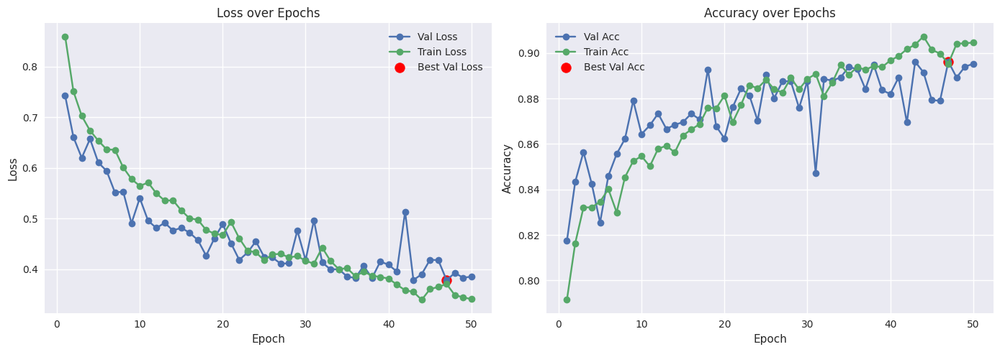

In [33]:
num_epochs = len(history["train_loss"])
epochs_range = range(1, num_epochs + 1)

train_loss = history["train_loss"]
val_loss   = history["val_loss"]
train_acc  = history["train_acc"]
val_acc    = history["val_acc"]

best_val_loss = np.min(val_loss)
best_val_loss_epoch = np.argmin(val_loss) + 1

best_val_acc = np.max(val_acc)
best_val_acc_epoch = np.argmax(val_acc) + 1

plt.figure(figsize=(14, 5))


plt.subplot(1, 2, 2)
plt.plot(epochs_range, val_acc,   label='Val Acc',   marker='o')
plt.plot(epochs_range, train_acc, label='Train Acc', marker='o')


plt.scatter(best_val_acc_epoch, best_val_acc, color='red', s=100, label='Best Val Acc')

plt.title('Accuracy over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 1)
plt.plot(epochs_range, val_loss,   label='Val Loss',   marker='o')
plt.plot(epochs_range, train_loss, label='Train Loss', marker='o')


plt.scatter(best_val_loss_epoch, best_val_loss, color='red', s=100, label='Best Val Loss')

plt.title('Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()




plt.tight_layout()
plt.show()

## Plottings

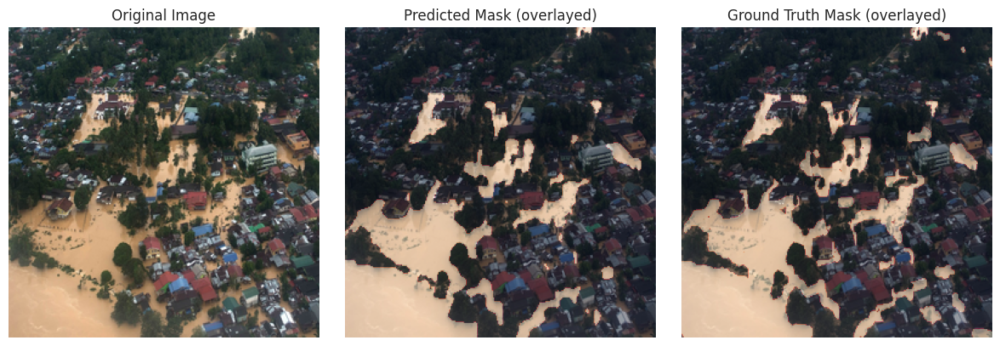

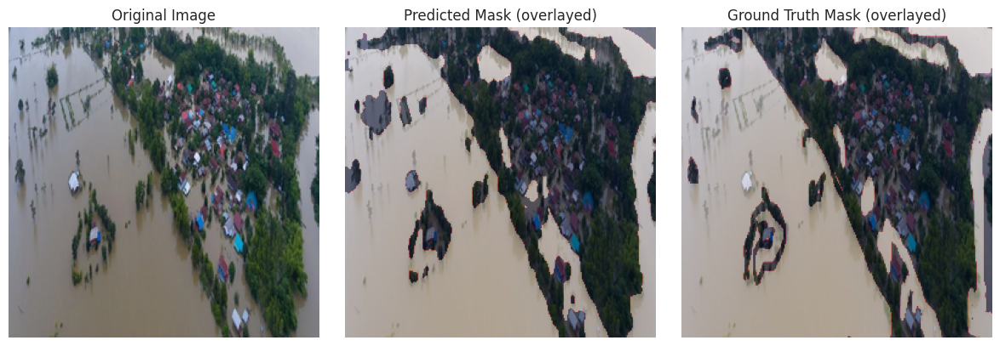

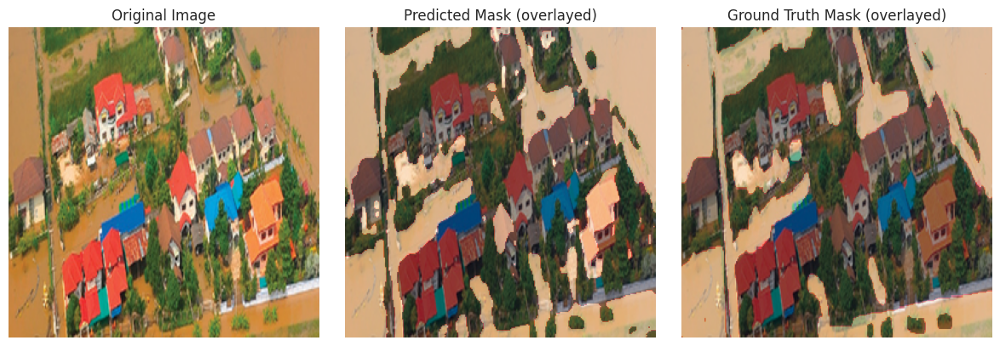

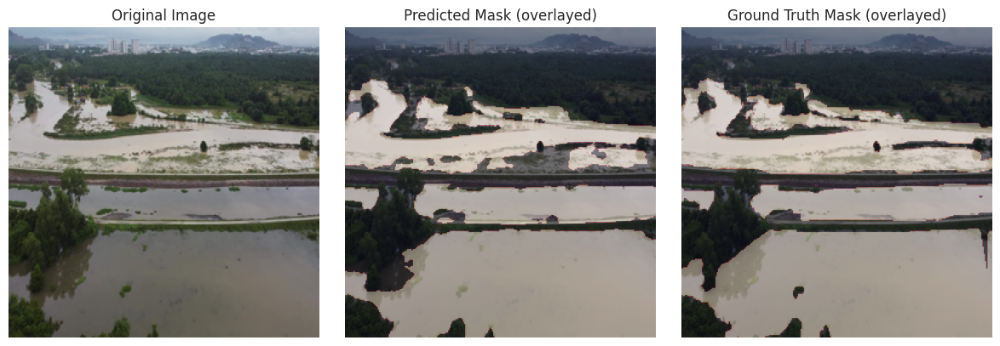

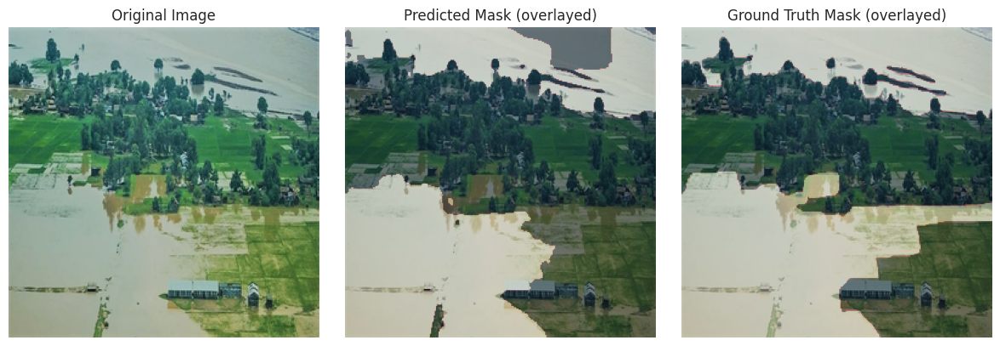

In [34]:
num_samples = 5

unet_model.eval()

val_dataset = val_loader.dataset

indices = random.sample(range(len(val_dataset)), num_samples)

for i, idx in enumerate(indices):
    img, true_mask = val_dataset[idx]

    img = img.unsqueeze(0).to(device)
    true_mask = true_mask.unsqueeze(0).to(device)

    with torch.no_grad():
        pred_mask = unet_model(img)


    pred_mask_bin = (pred_mask > 0.5).float()

    img_np = img.squeeze(0).cpu().numpy()
    true_mask_np = true_mask.squeeze(0).cpu().numpy()
    pred_mask_np = pred_mask_bin.squeeze(0).cpu().numpy()

    if img_np.shape[0] == 3:
        img_np = np.transpose(img_np, (1, 2, 0))
    else:
        img_np = img_np[0]

    true_mask_np = np.transpose(true_mask_np, (1, 2, 0))
    pred_mask_np = np.transpose(pred_mask_np, (1, 2, 0))


    fig, axs = plt.subplots(1, 3, figsize=(12, 4))

    axs[0].imshow(img_np, cmap='gray' if len(img_np.shape) == 2 else None)
    axs[0].set_title("Original Image")
    axs[0].axis('off')

    axs[1].imshow(img_np, cmap='gray' if len(img_np.shape) == 2 else None)
    axs[1].imshow(pred_mask_np.squeeze(), alpha=0.4)
    axs[1].set_title("Predicted Mask (overlayed)")
    axs[1].axis('off')

    axs[2].imshow(img_np, cmap='gray' if len(img_np.shape) == 2 else None)
    axs[2].imshow(true_mask_np.squeeze(), alpha=0.4)
    axs[2].set_title("Ground Truth Mask (overlayed)")
    axs[2].axis('off')

    plt.tight_layout()
    plt.show()

1. **Comparison with Conventional Loss Functions**:
    - How do Dice and Jaccard Losses differ from Cross-Entropy or Mean Squared Error, particularly in terms of sensitivity to class imbalances?<br>
    به دلیل نحوه تعریف ضرایب، ضررهای دایس و جاکارد بیشتر بر هم‌پوشانی پیکسل‌های پیش‌بینی‌شده و واقعی تمرکز می‌کنند و به عدم‌توازن کلاس‌ها حساس‌تر هستند؛ در حالی که ضررهای کراس‌آنتروپی و ام‌اس‌ای معمولاً تأکید کمتری بر نواحی مشترک دارند و در شرایط عدم‌توازن از دقت کمتری برخوردارند.
    - What advantages do these losses offer in capturing the spatial overlap between the predicted and true segmentations?<br>
    این ضرایب به‌طور ویژه بر هم‌پوشانی بین ناحیه‌های پیش‌بینی‌شده و ماسک اصلی تأکید دارند و کوچک‌ترین اختلافات در پیکسل‌های مشترک را برجسته می‌کنند؛ به همین دلیل ساختار فضایی را با دقت بیشتری حفظ می‌کنند.

2. **Interpretation of Loss Values**:
    - Discuss what high or low loss scores reveal about the state and effectiveness of your segmentation model.<br>
    مقدار بالای خطا نشان‌دهنده‌ی هم‌پوشانی ضعیف مدل با ماسک اصلی و عملکرد نامناسب آن است. در مقابل، مقدار پایین خطا بیانگر تطابق خوب و کارایی بالای مدل در شناسایی مرزهای شیء می‌باشد.

Evaluate the role of the attention mechanism in optimizing segmentation accuracy in cluttered environments. How does it refine the segmentation process?<br>
مکانیزم اتنشن با برجسته‌سازی ناحیه‌های مهم تصویر به مدل این امکان را می‌دهد که در محیط‌های شلوغ، اطلاعات غیرضروری را نادیده گرفته و بر محدوده‌های کلیدی تمرکز کند، که در نهایت منجر به بهبود دقت در تقسیم‌بندی می‌شود.

What is the importance of skip connections in U-Net, and how do they enhance the accuracy of segmentation tasks?<br>
اتصال‌های اسکیپ در یونت اطلاعات مکانی سطح پایین را به مراحل بالاتر انتقال می‌دهند و از از دست رفتن جزئیات طی فرآیند نمونه‌برداری جلوگیری می‌کنند. این اتصال‌ها امکان می‌دهند که مدل به‌طور همزمان ویژگی‌های جزئی و ساختار کلی را در نظر بگیرد و خروجی دقیق‌تری ارائه دهد.

Explain the difference between the predicted and processed mask above.<br>
در تصویر ماقبل آخر مشاهده می‌کنید که مدل در تشخیص جاده روی آب عملکرد کاملاً دقیقی ندارد، زیرا رنگ آسفالت جاده به رنگ آب مجاور شباهت دارد. برای بهبود این مسئله می‌توان در آموزش‌های بعدی با تنظیم مناسب هایپرپارامترها این نقص را برطرف کرد.